# Machine Learning & Data Mining Task 2

In [61]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score

In [2]:
dataset = pd.read_csv("clustering_data/gt_2012.csv")

In [3]:
# import os
# import pandas as pd

# # Specify the directory containing the CSV files
# directory_path = 'clustering_data'

# # Create an empty DataFrame to store the combined data
# dataset = pd.DataFrame()

# # Iterate over each file in the directory
# for filename in os.listdir(directory_path):
#     if filename.endswith('.csv'):
#         file_path = os.path.join(directory_path, filename)
        
#         # Read the CSV file into a DataFrame
#         current_data = pd.read_csv(file_path)
        
#         # Concatenate the current DataFrame with the combined DataFrame
#         dataset = pd.concat([dataset, current_data], ignore_index=True)

# # Now, combined_data contains the data from all CSV files in the specified directory


In [21]:
# checking the top 5 rows
dataset.head()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
0,6.8594,1007.9,96.799,3.5000,19.663,1059.2,550.00,114.70,10.605,3.1547,82.722
1,6.7850,1008.4,97.118,3.4998,19.728,1059.3,550.00,114.72,10.598,3.2363,82.776
2,6.8977,1008.8,95.939,3.4824,19.779,1059.4,549.87,114.71,10.601,3.2012,82.468
3,7.0569,1009.2,95.249,3.4805,19.792,1059.6,549.99,114.72,10.606,3.1923,82.670
4,7.3978,1009.7,95.150,3.4976,19.765,1059.7,549.98,114.72,10.612,3.2484,82.311


In [22]:
# checking bottom top 5 rows
dataset.tail()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
7623,10.0370,1022.1,88.531,2.9192,23.641,1083.6,549.91,132.61,11.745,1.6560,76.068
7624,9.8921,1022.2,87.622,2.9415,23.859,1084.9,550.08,133.57,11.869,1.5549,74.930
7625,9.8723,1022.0,86.618,2.9309,23.817,1084.8,549.99,133.50,11.914,1.4093,75.041
7626,10.0260,1022.0,87.301,2.9363,23.831,1084.5,550.01,133.20,11.811,1.3963,74.460
7627,10.0590,1021.8,88.012,2.4579,19.526,1047.5,542.91,111.24,10.585,8.0107,86.066


In [5]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7628 entries, 0 to 7627
Data columns (total 11 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   AT      7628 non-null   float64
 1   AP      7628 non-null   float64
 2   AH      7628 non-null   float64
 3   AFDP    7628 non-null   float64
 4   GTEP    7628 non-null   float64
 5   TIT     7628 non-null   float64
 6   TAT     7628 non-null   float64
 7   TEY     7628 non-null   float64
 8   CDP     7628 non-null   float64
 9   CO      7628 non-null   float64
 10  NOX     7628 non-null   float64
dtypes: float64(11)
memory usage: 655.7 KB


In [6]:
# Getting a summary statistics of the dataset
dataset.describe()

,AT,AP,AH,AFDP,GTEP,TIT,TAT,TEY,CDP,CO,NOX
count,7628.000000,7628.000000,7628.000000,7628.000000,7628.000000,7628.000000,7628.000000,7628.000000,7628.000000,7628.000000,7628.000000
mean,18.397950,1012.258153,79.074804,4.306717,25.181361,1082.890233,546.263793,132.675552,12.000121,2.361133,68.788965
std,7.661038,6.384291,14.105087,0.831170,4.006825,16.852148,7.331345,15.302140,1.049384,2.474116,10.224937
min,0.522300,985.850000,30.344000,2.087400,18.100000,1024.600000,513.060000,101.150000,9.928600,0.007505,41.777000
25%,12.269250,1008.400000,69.165250,3.882650,23.090750,1075.800000,547.657500,125.240000,11.469750,1.127125,62.531250
50%,19.120500,1012.000000,82.411500,4.298050,25.221000,1089.100000,549.920000,133.760000,12.041000,1.636300,67.246500
75%,24.337250,1016.000000,90.356250,4.670525,26.322250,1093.800000,550.070000,134.900000,12.290000,2.953025,73.424500
max,34.929000,1031.800000,100.200000,7.610600,37.402000,1100.800000,550.530000,174.610000,15.081000,44.103000,119.890000


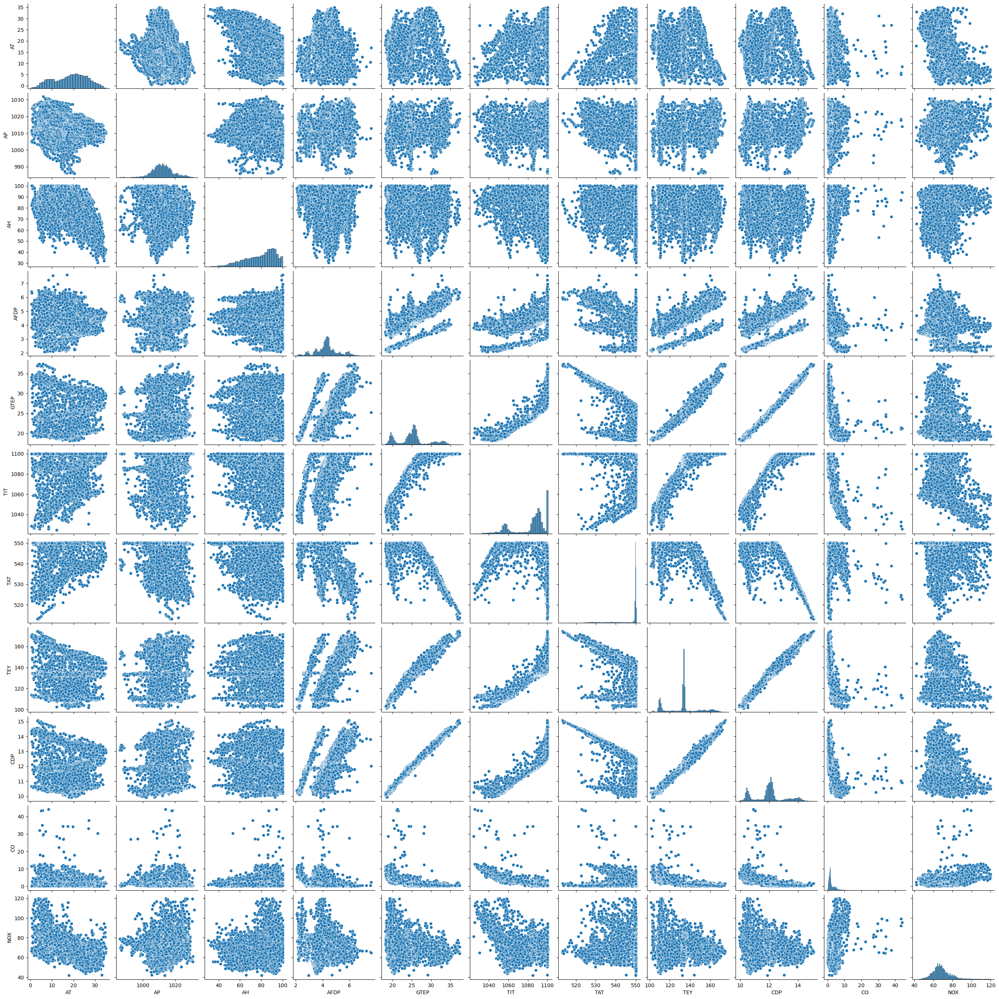

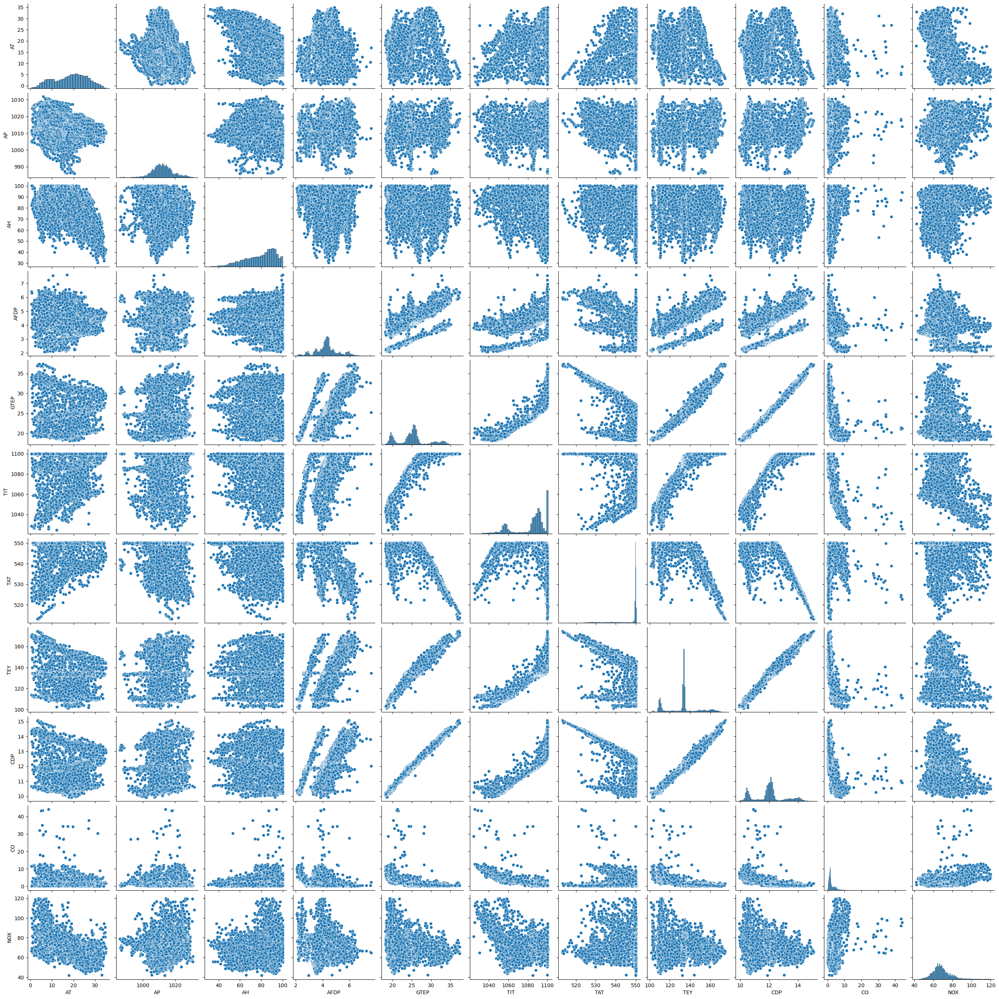

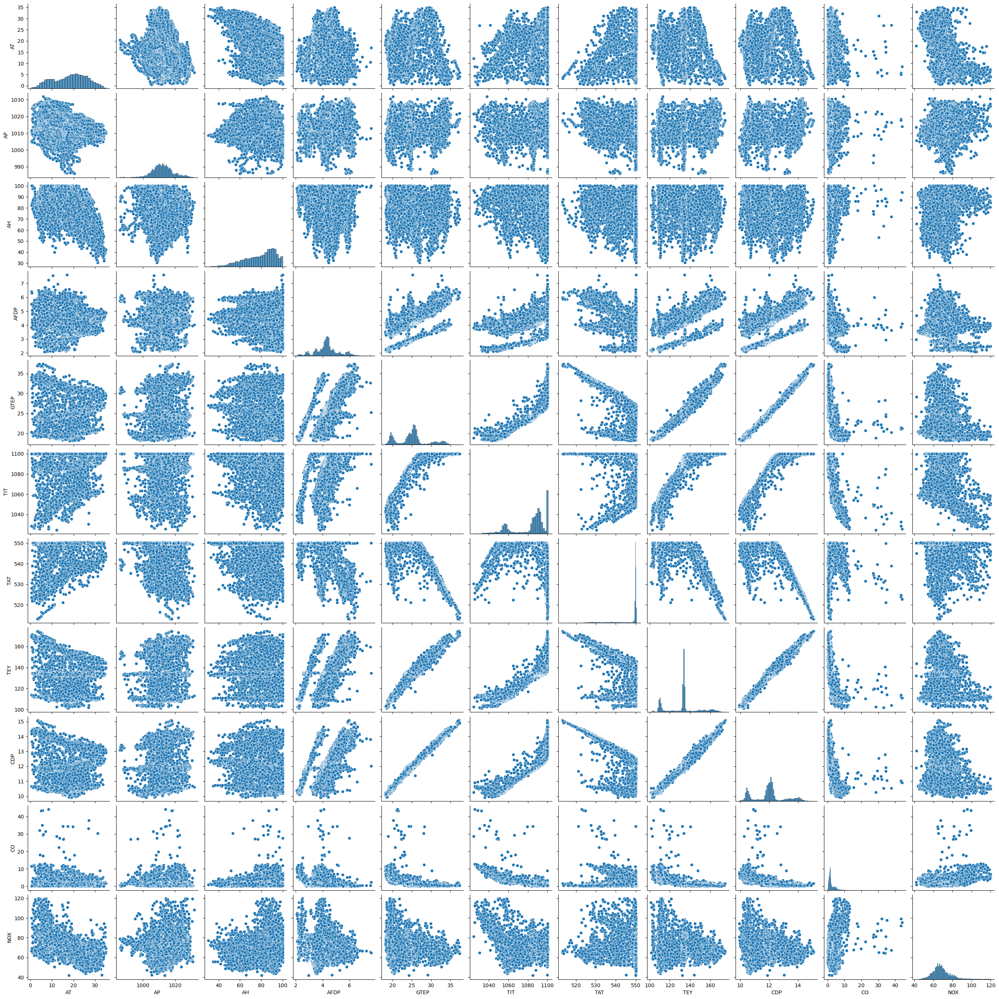

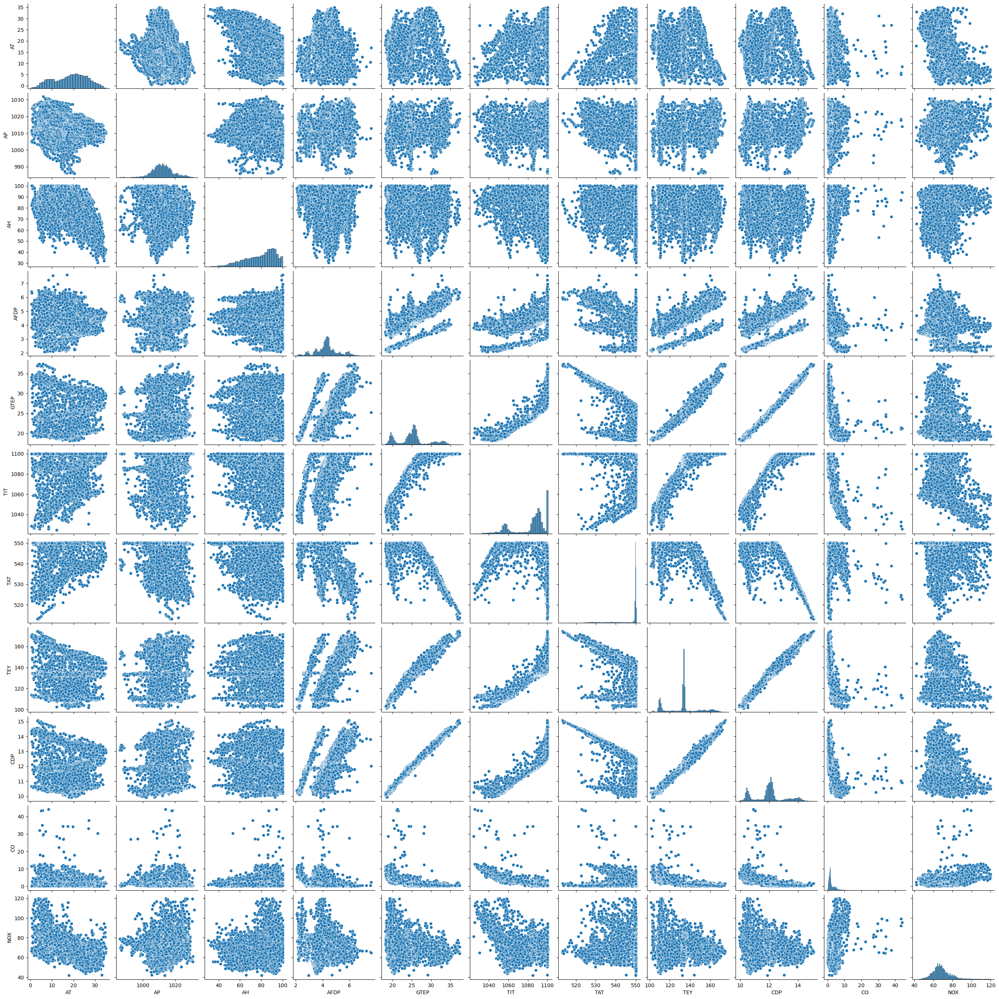

In [28]:
# plot relationship between variable pair
sns.pairplot(dataset)
plt.show()

In [8]:
dataset.isnull().sum()

AT      0
AP      0
AH      0
AFDP    0
GTEP    0
TIT     0
TAT     0
TEY     0
CDP     0
CO      0
NOX     0
dtype: int64

In [9]:
dataset.shape

(7628, 11)

### Standardize the data:
- It's a good practice to standardize the features before applying clustering algorithms

In [10]:
# scaling the features
scaler = StandardScaler()
X = scaler.fit_transform(dataset)

### Determine the optimal number of clusters (K):
- Getting the optimal number of clusters using the elbow method. 
- This involves fitting the model with different values of K and plotting the inertia (within-cluster sum of squares) to identify the "elbow" point.

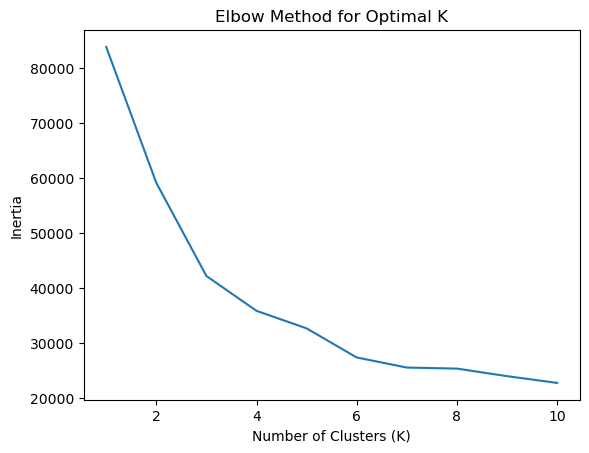

In [11]:
# Using the elbow method to find the optimal number of clusters
inertia = []

for k in range(1, 11):
    kmeans = KMeans(n_clusters = k, init = 'k-means++', n_init='auto', random_state = 42)
    kmeans.fit(X)
    inertia.append(kmeans.inertia_)

# Plot the elbow method
plt.plot(range(1, 11), inertia)
plt.title('Elbow Method for Optimal K')
plt.xlabel('Number of Clusters (K)')
plt.ylabel('Inertia')
plt.show()

## Training and Fitting K-Mean on the Dataset

In [54]:
# Fitting k-Mean to the dataset
kmeans = KMeans(n_clusters = 3, init = 'k-means++', n_init='auto', random_state = 42)
y_kmeans = kmeans.fit_predict(X)

Using the below code, we can instantiate a PCA object. When instantiating it we
define how many components (or dimensions) we want to retain. We then use
the fit_transform() method to perform PCA and return the fitted data with only
two dimensions.


In [55]:
# reducing dimensionality for visualizse

from sklearn.decomposition import PCA

pca = PCA(n_components=3)
X_reduced = pca.fit_transform(X)

pca.explained_variance_ratio_

array([0.46660388, 0.20241033, 0.09005552])

In [56]:
sum(pca.explained_variance_ratio_)

0.7590697396143392

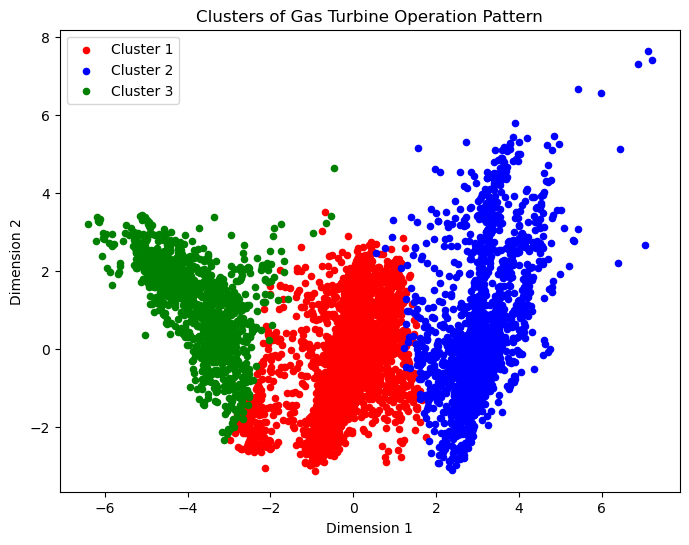

In [89]:
# Visualising the cluster

colours = ['red', 'blue', 'green']

plt.figure(figsize=(8,6))
for i in range(3):
    plt.scatter(X_reduced[y_kmeans == i, 0], X_reduced[y_kmeans == i, 1],
               s = 20, c = colours[i], label = 'Cluster '+str(i+1))
plt.title('Clusters of Gas Turbine Operation Pattern')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.show()

## Evaluation of K-Mean Clustering

In [62]:
# evaluate model using silhouette_score
silhouette = silhouette_score(X_reduced, y_kmeans)
silhouette

0.4425541468213602

In [63]:
# evaluate model using davies_bouldin_score
davies_bouldin_evaluation = davies_bouldin_score(X_reduced, y_kmeans)
davies_bouldin_evaluation

0.9001065395197241

## Part Two: Hierarchical Clustering


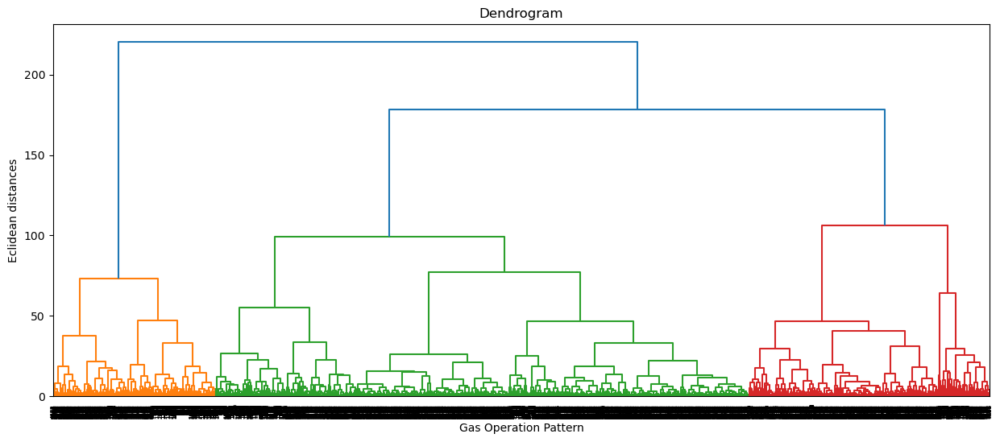

In [91]:
#Using the dendrogram to find the optimal number of clusters
import scipy.cluster.hierarchy as sch

plt.figure(figsize=(15, 6))
dendrogram = sch.dendrogram(sch.linkage(X, method = 'ward'))
plt.title('Dendrogram')
plt.xlabel('Gas Operation Pattern')
plt.ylabel('Eclidean distances')
plt.show()

In [81]:
# fitting Hierarchical clustering to the dataset
from sklearn.cluster import AgglomerativeClustering
hc = AgglomerativeClustering(n_clusters = 3, metric='euclidean', linkage='ward')
y_hc = hc.fit_predict(X)

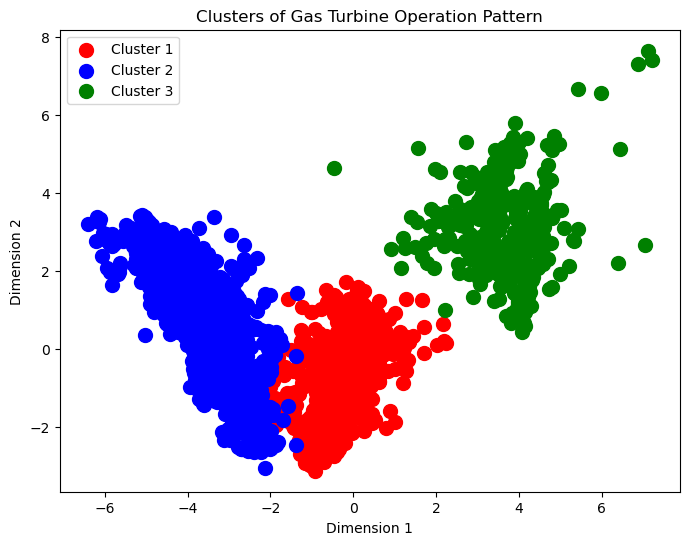

In [90]:
# Visualising the cluster

colours = ['red', 'blue', 'green']

plt.figure(figsize=(8,6))
for i in range(3):
    plt.scatter(X_reduced[y_hc == i, 0], X_reduced[y_hc == i, 1],
               s = 100, c = colours[i], label = 'Cluster '+str(i+1))
plt.title('Clusters of Gas Turbine Operation Pattern')
plt.xlabel('Dimension 1')
plt.ylabel('Dimension 2')
plt.legend()
plt.show()

## Evaluation of Hierarchical Clustering

In [79]:
# evaluate model using silhouette_score
silhouette_y_hc = silhouette_score(X_reduced, y_hc)
silhouette_y_hc

0.40276176677421377

In [83]:
# evaluate model using davies_bouldin_score
davies_bouldin_evaluation_y_hc = davies_bouldin_score(X_reduced, y_hc)
davies_bouldin_evaluation_y_hc

0.9855453063044051